In [ ]:
# Python code based on Elsa Arcaute's R code

In [39]:
import geopandas as gpd
import pandas as pd
import networkx as nx
import igraph as ig
import matplotlib.pyplot as plt
from shapely.geometry import LineString, Point
import numpy as np

% matplotlib inline
nx.__version__

'2.1'

# Data Preparation

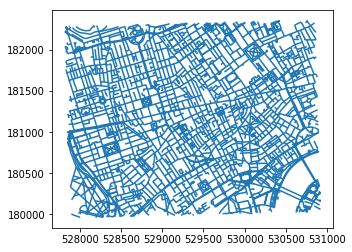

In [2]:
#You first need to go to the following website to extract the shape file for the bit of street network that you need
# http://extract.bbbike.org
#follow the video that shows what you need to do once in the website: "ExtractingShapeFileFromWeb.mov"
#feel free to change the horrible name that you will get of the directory in order to avoid issues
#here we changed "planet_-0.159,51.504_-0.115,51.525-shp" to "Central_London_Shapefile" which is the selected area

#load the shapefile as it comes from OSM
ldn = gpd.read_file(r'Central_London_Shapefile/shape/roadsExplodedBNG.shp')

# Have a quick look
ldn.plot();

In [3]:
# We need to break the linestrings up into individual segments
# A simple approach is to loop over the geodataframe rows and then over each linestring

# list to hold segmented linestrings
segments = []
# list to hold id of segments
idx = []
# list to hold all coordinate points
points = []
# loop for as many rows as exist
for i in range(0,len(ldn)):
    # Get linestring coords
    ls = ldn.iloc[i].geometry.coords
    # Add points to list
    points += [pnt for pnt in ls]
    # iterate over coordinates (NB from 2nd coord)
    for j in range(1,len(ls)):
        # Append segments as new linestrings
        segments.append(LineString([ls[j-1],ls[j]]))
        # Append ids
        idx.append(i)

#Turn lists back into geodataframe
ldn_segs = gpd.GeoDataFrame(idx,columns = ['Line_id'],geometry = segments)

# Get unique points
points = list(set(points))
# Turn into geodataframe
ldn_pnts = gpd.GeoDataFrame(range(0,len(points)),columns = ['pnt_id'], geometry = [Point(p) for p in points])

In [4]:
# Extract x and y to dataframe
ldn_pnts['X'] = ldn_pnts['geometry'].apply(lambda p: p.x)
ldn_pnts['Y'] = ldn_pnts['geometry'].apply(lambda p: p.y)

# Extract x1, y1 and x2, y2 to dataframe
ldn_segs['X1'] = ldn_segs['geometry'].apply(lambda ls: ls.coords[0][0])
ldn_segs['Y1'] = ldn_segs['geometry'].apply(lambda ls: ls.coords[0][1])
ldn_segs['X2'] = ldn_segs['geometry'].apply(lambda ls: ls.coords[1][0])
ldn_segs['Y2'] = ldn_segs['geometry'].apply(lambda ls: ls.coords[1][1])

In [5]:
# Now merge the segs and pnts on the x and y values to create start and end IDs

# Firstly for the start of the line
ldn_segs = ldn_segs.merge(ldn_pnts[['pnt_id','X','Y']], left_on = ['X1','Y1'], right_on = ['X','Y'])
ldn_segs.rename(columns ={'pnt_id':'idStartNode'}, inplace = True)
del ldn_segs['X'], ldn_segs['Y']

# Secondly for the end of the line
ldn_segs = ldn_segs.merge(ldn_pnts[['pnt_id','X','Y']], left_on = ['X2','Y2'], right_on = ['X','Y'])
ldn_segs.rename(columns ={'pnt_id':'idEndNode'}, inplace = True)
del ldn_segs['X'], ldn_segs['Y']

In [6]:
# Finally, create a weight field that holds segment lengths.
ldn_segs['weight'] = ldn_segs['geometry'].length

In [ ]:
# We can save this edgelist as a file if we want.
ldn_segs.to_csv('London_network_osm.csv')

# Networkx

In [62]:
# Create a weighted graph from the ldn_segs geodataframe
# NB There seem to be some duplicated edges, so use a multigraph
g_osm = nx.from_pandas_edgelist(ldn_segs,'idStartNode','idEndNode',edge_attr = 'weight', create_using=nx.MultiGraph())

In [63]:
# Number of islands or disconnected components
nx.number_connected_components(g_osm)

55

In [64]:
# There are 55 disconnected components, so let's just take the largest one.
g_osm = g_osm.subgraph(max(nx.connected_components(g_osm), key=len))

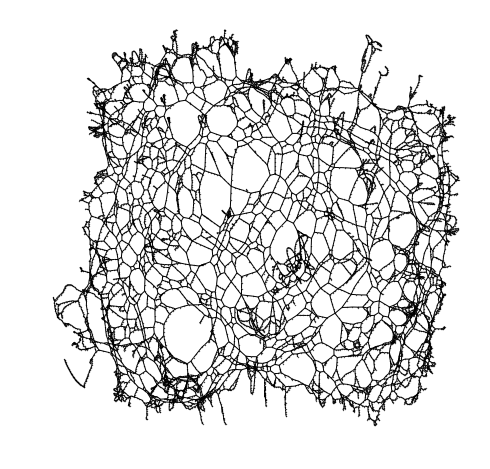

In [14]:
#If we plot the network as it is, we won't get any sense of what it is, since the nodes have not been spatially specified.
f, ax = plt.subplots(figsize=(8,8))

# networkx is bad at drawing large graphs, so I'm using graphviz to make me a layout
# this can be skipped if you don't want to install graphviz, pygraphviz and pydot
# the best bet is then to use the random layout networkx
pos = nx.nx_pydot.graphviz_layout(g_osm, prog = 'sfdp')

# matplotlib finds this hard to draw, expect it to take some time!
nx.draw(g_osm, pos=pos, ax=ax, node_size = 0.1, node_color = 'k')

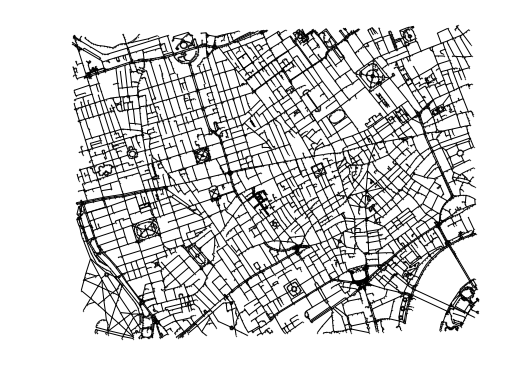

In [68]:
# Let's create some coordinates to use for plotting

# convert the points geodataframe info to a dictionary of positions
pos = ldn_pnts[['pnt_id','X','Y']].set_index('pnt_id').T.to_dict('list')

f, ax = plt.subplots(figsize=(8,8))
nx.draw(g_osm, pos=pos, ax=ax, node_size = 0.1, node_color = 'k')
ax.set_aspect('equal')

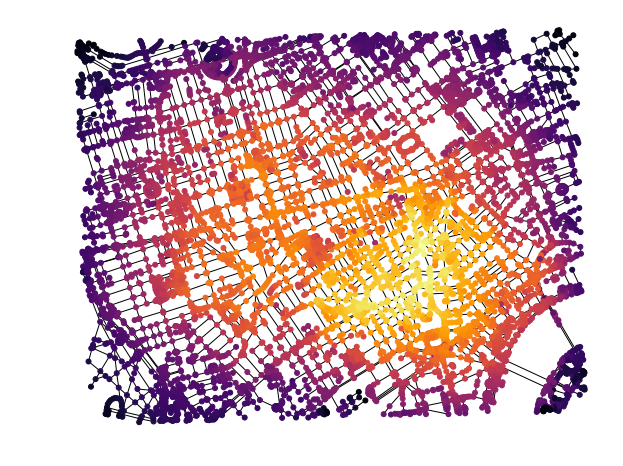

In [70]:
#let us now compute closeness centrality - takes too long.
# Unfortunately networkx doesn't implement a cutoff like igraph does
#clos_osm = nx.closeness_centrality(g_osm, distance = 'weight')

# make clos_london a pandas dataframe for ease of use
#clos_osm = pd.DataFrame.from_dict(clos_osm, orient='index')

# Borrowing clos_osm from python igraph (below)
clos_osm = pd.DataFrame.from_dict(dict(zip([v.index for v in g_osm2.vs()],clos_osm)), orient='index')

# Plot the centrality on the graph
f, ax = plt.subplots(figsize=(10,10))
nx.draw(g_osm,pos=pos, ax = ax, node_size = 25, cmap = 'inferno', node_color = clos_osm[0])
ax.set_aspect('equal')

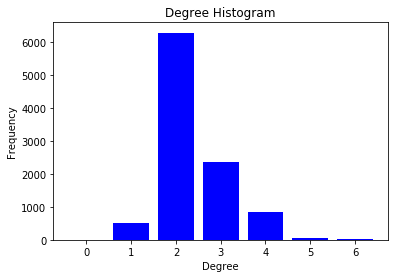

In [71]:
#And what about the degree distribution???
#let us see how many nodes of each degree there are:
degree = nx.degree_histogram(g_osm)

f, ax = plt.subplots()
ax.bar(range(0,len(degree)),degree, width=0.80, color='b')

ax.set_title("Degree Histogram")
ax.set_ylabel("Frequency")
ax.set_xlabel("Degree");

# igraph

In [56]:
g_osm2 = ig.Graph(directed = False)

# As I labelled my points from 0, I can use these directly as node indices!
g_osm2.add_vertices(ldn_pnts['pnt_id'].values)

# Add vertex x and y positions - times y by -1 to flip for Cairo plotting
g_osm2.vs['x'] = ldn_pnts['X'].values
g_osm2.vs['y'] = ldn_pnts['Y'].values *-1.0

# Now take the edge list and add edges..
g_osm2.add_edges(ldn_segs[['idStartNode','idEndNode']].values)

# Finally add edge weights
g_osm2.es['weight'] = ldn_segs['weight'].values

In [57]:
# Number of islands or disconnected components
len(g_osm2.clusters().subgraphs())

55

In [58]:
# There are 55 disconnected components, so let's just take the largest one.
clust = g_osm2.clusters(mode='weak')
g_osm2 = clust.giant()

In [34]:
#If we plot the network with a graph layout, we won't get any sense of what it is.
ig.plot(g_osm2, layout = g_osm2.layout_drl(), vertex_size = 0.1, bbox =(400,400))

In [72]:
# Because I added 'x' and 'y' coordinates to the vertices earlier, igraph knowns how to plot spatially
ig.plot(g_osm2, vertex_size = 0.1, bbox =(450,400))

In [73]:
clos_osm = g_osm2.closeness(weights= 'weight', cutoff = 1000)

# First normalize the data 0-1
norm = (np.array(clos_osm) - min(clos_osm)) / (max(clos_osm) - min(clos_osm))
# Now get a colourmap
cmap = plt.cm.get_cmap('hot')
# Now get rgba values, but throw away alpha, and map to a list of tuples
palette = map(tuple,cmap(norm)[:,0:3])

ig.plot(g_osm2, vertex_size = 5, vertex_color = palette, bbox =(450,400))

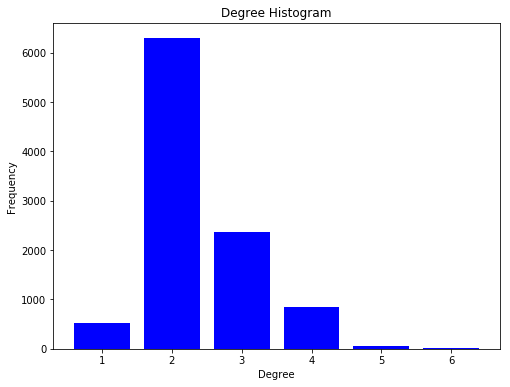

In [84]:
# Check out degree distribution
f, ax = plt.subplots(figsize = (8,6))
degree = np.array([b for b in g_osm2.degree_distribution().bins()])
ax.bar(degree[:,0],degree[:,2], width=0.80, color='b')

ax.set_title("Degree Histogram")
ax.set_ylabel("Frequency")
ax.set_xlabel("Degree");